<a href="https://colab.research.google.com/github/Maymiyam/ml_demand_forecasting/blob/main/Bike_rental_demand_analysis_and_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Описание проекта

**Анализ и прогнозирование спроса в прокате велосипедов**

В рамках данного проекта проводится анализ данных о прокате велосипедов в Корее за год с целью выявления факторов, влияющих на спрос на услуги проката. Работа предполагает комплексный анализ и прогнозирование с использованием методов машинного обучения.

## Описание данных
1. **Дата (Date):** Дата записи.
2. **Количество арендованных велосипедов (Rented Bike Count):** Целевая переменная, количество велосипедов, взятых в аренду.
3. **Час (Hour):** Час дня.
4. **Температура (Temperature):** Температура воздуха в градусах Цельсия.
5. **Влажность (Humidity):** Влажность воздуха.
6. **Скорость ветра (Wind Speed):** Скорость ветра в м/с.
7. **Видимость (Visibility):** Мера различимости объектов на расстоянии в 10 метров.
8. **Точка росы (Dew Point Temperature):** Температура, зарегистрированная в начале дня, в градусах Цельсия.
9. **Интенсивность солнечного света (Solar Radiation):** Интенсивность солнечного света.
10. **Осадки (Rainfall):** Количество осадков в мм.
11. **Снегопад (Snowfall):** Количество выпавшего снега в мм.
12. **Сезоны (Seasons):** Время года.
13. **Праздник (Holiday):** Является ли день праздничным.
14. **Рабочий день (Functioning Day):** Маркер, работал ли сервис проката в указанное время.

## Цель проекта
Проанализировать данные и выявить ключевые факторы, влияющие на потребность в прокате велосипедов, а также построить модель прогнозирования спроса.

## Задачи
1. **Предобработка данных:** Проверка на выбросы, ошибки, пропуски, дубликаты и коррекция типов данных.
2. **Исследовательский анализ данных (EDA):** Проведение уровневого анализа с использованием визуализаций, изучение распределений и взаимосвязей признаков.
3. **Подготовка данных для моделирования:** Кодирование признаков, масштабирование данных, разбиение выборки на обучающую и тестовую.
4. **Реализация базовой регрессионной модели:** Прогнозирование количества велосипедов, взятых в аренду.
5. **Оптимизация модели:** Использование инструментов отбора признаков и настройки гиперпараметров для достижения наилучшей модели по метрикам adjusted R2 и RMSE.

## Оформление работы
Проект должен быть представлен в виде аналитического отчета с подробным описанием каждого этапа и сопроводительными выводами.

**Обязательный критерий:** Достичь adjusted R2 не менее 85%.

### Project Description (eng)

Project Title: "Bike Rental Demand Analysis and Prediction"

Project Description:

Working with a year's worth of bike rental service data in Korea, this project aims to explore the factors influencing bike rental demand.

Data Description:

- Date: Date of the record
- Rented Bike Count: Number of bikes rented (target variable)
- Hour: Hour of the day
- Temperature: Air temperature in Celsius
- Humidity: Air humidity
- Wind Speed: Wind speed in m/s
- Visibility: Visibility at 10 meters
- Dew Point Temperature: Dew point temperature in Celsius
- Solar Radiation: Intensity of solar radiation
- Rainfall: Amount of rainfall in mm
- Snowfall: Amount of snowfall in mm
- Seasons: Season of the year
- Holiday: Whether the day is a holiday
- Functioning Day: Marker indicating if the bike rental service was operational at that time

Project Goal: Analyze the data and identify factors influencing bike rental demand.

Tasks:
1. Data Preprocessing: Check for outliers, errors, missing values, duplicates, and incorrect data types.
2. Exploratory Data Analysis (EDA): Implement all levels of analysis (univariate/multivariate) using visualizations, study feature distributions, and relationships.
3. Prepare Data for Modeling: Encode features, scale data, and split the dataset into training and testing sets.
4. Implement a basic regression model to predict the number of bikes rented.
5. Use Feature Selection tools and hyperparameter tuning to find the best predictive model based on adjusted R2 (primary metric) and RMSE.

Mandatory Criterion: Achieve an adjusted R2 of at least 85%.

# 1. Работа с данными

In [78]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [79]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

from hyperopt import fmin, tpe, hp, STATUS_OK, Trials, space_eval
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import RFE

In [80]:
url = 'https://raw.githubusercontent.com/obulygin/content/main/SeoulBike/seoul_bike_data.csv'

try:
    data = pd.read_csv(url, encoding='latin-1')
except Exception as e:
    print(f"Ошибка при загрузке данных: {e}")

df = data.copy()
df

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.00,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.00,0.0,0.0,Winter,No Holiday,Yes
5,01/12/2017,100,5,-6.4,37,1.5,2000,-18.7,0.00,0.0,0.0,Winter,No Holiday,Yes
6,01/12/2017,181,6,-6.6,35,1.3,2000,-19.5,0.00,0.0,0.0,Winter,No Holiday,Yes
7,01/12/2017,460,7,-7.4,38,0.9,2000,-19.3,0.00,0.0,0.0,Winter,No Holiday,Yes
8,01/12/2017,930,8,-7.6,37,1.1,2000,-19.8,0.01,0.0,0.0,Winter,No Holiday,Yes
9,01/12/2017,490,9,-6.5,27,0.5,1928,-22.4,0.23,0.0,0.0,Winter,No Holiday,Yes


## Предобработка данных

Провести предобработку данных: проверить данные на наличие выбросов, ошибочных значений, пропусков, дубликатов и некорректных типов.

In [81]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [82]:
# проверка на дубликаты и пропуски
print(f'Найдено дубликатов {df.duplicated().sum()}')
df.drop_duplicates(inplace=True)
df.dropna(inplace=True)
print(f'Найдено пропусков:{df.isnull().sum().sum()}\n{df[df.columns[df.isnull().any()]].isnull().sum()}')

Найдено дубликатов 0
Найдено пропусков:0
Series([], dtype: float64)


In [83]:
# переведем даты в правильный формат
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date                       8760 non-null   datetime64[ns]
 1   Rented Bike Count          8760 non-null   int64         
 2   Hour                       8760 non-null   int64         
 3   Temperature(°C)            8760 non-null   float64       
 4   Humidity(%)                8760 non-null   int64         
 5   Wind speed (m/s)           8760 non-null   float64       
 6   Visibility (10m)           8760 non-null   int64         
 7   Dew point temperature(°C)  8760 non-null   float64       
 8   Solar Radiation (MJ/m2)    8760 non-null   float64       
 9   Rainfall(mm)               8760 non-null   float64       
 10  Snowfall (cm)              8760 non-null   float64       
 11  Seasons                    8760 non-null   object        
 12  Holida

In [84]:
# переименуем столбцы для удобства
df.columns = df.columns.str.split('(').str[0].str.lower().str.rstrip().str.replace(' ', '_')
df.head(3)

,date,rented_bike_count,hour,temperature,humidity,wind_speed,visibility,dew_point_temperature,solar_radiation,rainfall,snowfall,seasons,holiday,functioning_day
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes


# 2. EDA

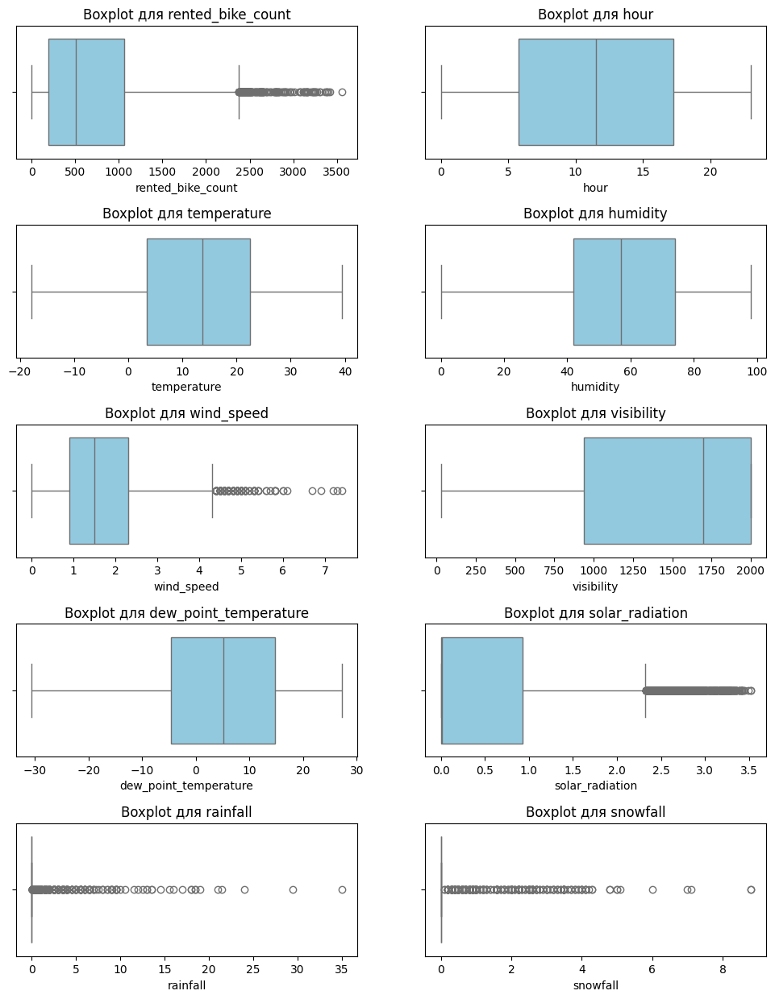

In [85]:
# проверим числовые данные на выбросы графическим способом

def plot_outliers(df):
    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

    # создадим сетку графиков
    rows = (len(numeric_columns) + 1) // 2
    fig, axes = plt.subplots(nrows=rows, ncols=2, figsize=(12, 3 * rows))
    fig.subplots_adjust(hspace=0.5)

    # график для каждого числового столбца
    for i, column in enumerate(numeric_columns):
        row, col = divmod(i, 2)
        sns.boxplot(data=df, x=df[column], ax=axes[row, col], color='skyblue')
        axes[row, col].set_title(f'Boxplot для {column}')

    plt.show()

plot_outliers(df)

Видим много выбросов в rented_bike_count, wind_speed, solar_radiation, rainfall и snowfall. Доминирующая часть значений rainfall и snowfall являются нулем (распределение сильно скошено вправо), поэтому те немногие, отличные от нуля, значения считаются выбросами

In [86]:
df_numeric = df.select_dtypes(include=['float', 'int']).columns.tolist()

def find_outliers_iqr(series):
    Q1 = np.percentile(series, 25)
    Q3 = np.percentile(series, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = series[(series < lower_bound) | (series > upper_bound)]
    return outliers

def check_outliers(df):
    for column in df_numeric:
        print(f"Выбросы в колонке {column}:")
        outliers = find_outliers_iqr(df[column])
        print(outliers)
        print()

check_outliers(df)

Выбросы в колонке rented_bike_count:
2946    2401
2994    2402
3114    2401
3210    2404
3282    2692
3498    2807
3522    2574
3546    2577
3618    2558
3714    2661
3785    2392
3834    3130
3835    2405
3882    2701
3928    2379
3929    2410
3954    2906
3978    2915
4072    2479
4074    2439
4098    2403
4122    3069
4123    2450
4170    3123
4171    2454
4194    2825
4218    2916
4290    3245
4291    2656
4338    3251
4339    2650
4362    3119
4363    2534
4386    3088
4387    2505
4435    2514
4436    2460
4458    3380
4459    2788
4460    2508
4461    2377
4482    3227
4483    2615
4485    2404
4530    3221
4531    2649
4554    3309
4555    2797
4556    2476
4601    2431
4640    2495
4650    3404
4651    2873
4652    2579
4653    2505
4672    2474
4673    2664
4674    2479
4675    2404
4698    2962
4721    2460
4722    2891
4723    2984
4724    2441
4745    2383
4746    2451
4747    2475
4748    2497
4749    2435
4770    2474
4771    2481
4772    2429
4796    2515
4808    2430
4

Видим много выбросов, но все они в рамках адекватных реалистичных значений (погодных условий) и вряд ли являются ошибочными. Также они важны для корректного анализа спроса, так как могут напрямую влиять на количество арендованных велосипедов, поэтому мы не будем от них избавляться или заменять, а позже масштабируем признаки

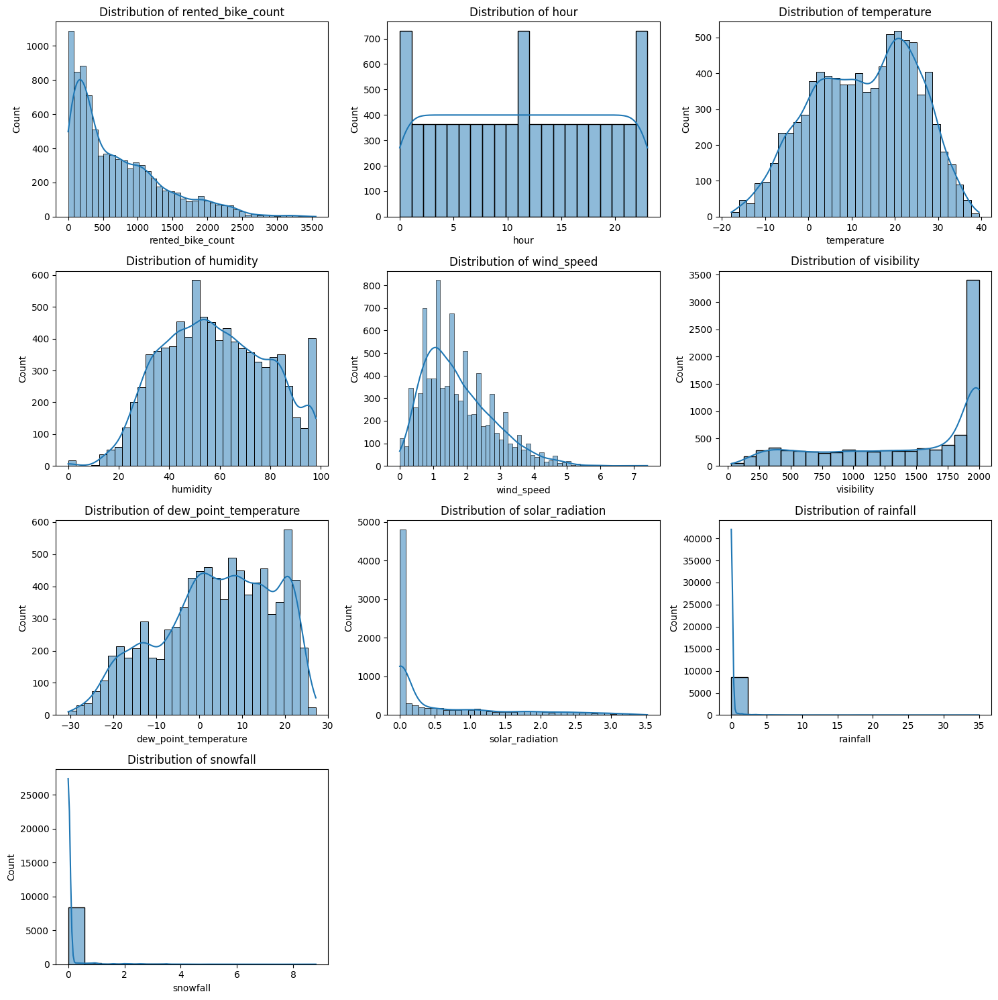

In [87]:
# посмотрим на распределения количества арендованных байков от каждого признака
plt.figure(figsize=(15, 15))

num_plots = len(df_numeric)
num_cols = 3
num_rows = (num_plots // num_cols) + (num_plots % num_cols)
for i, col in enumerate(df_numeric):
    plt.subplot(num_rows, num_cols, i + 1)
    sns.histplot(df[col].dropna(), kde=True)
    plt.title(f'Distribution of {col}')

plt.tight_layout()
plt.show()


Изучим также временные динамики аренды велосипедов в течение дня

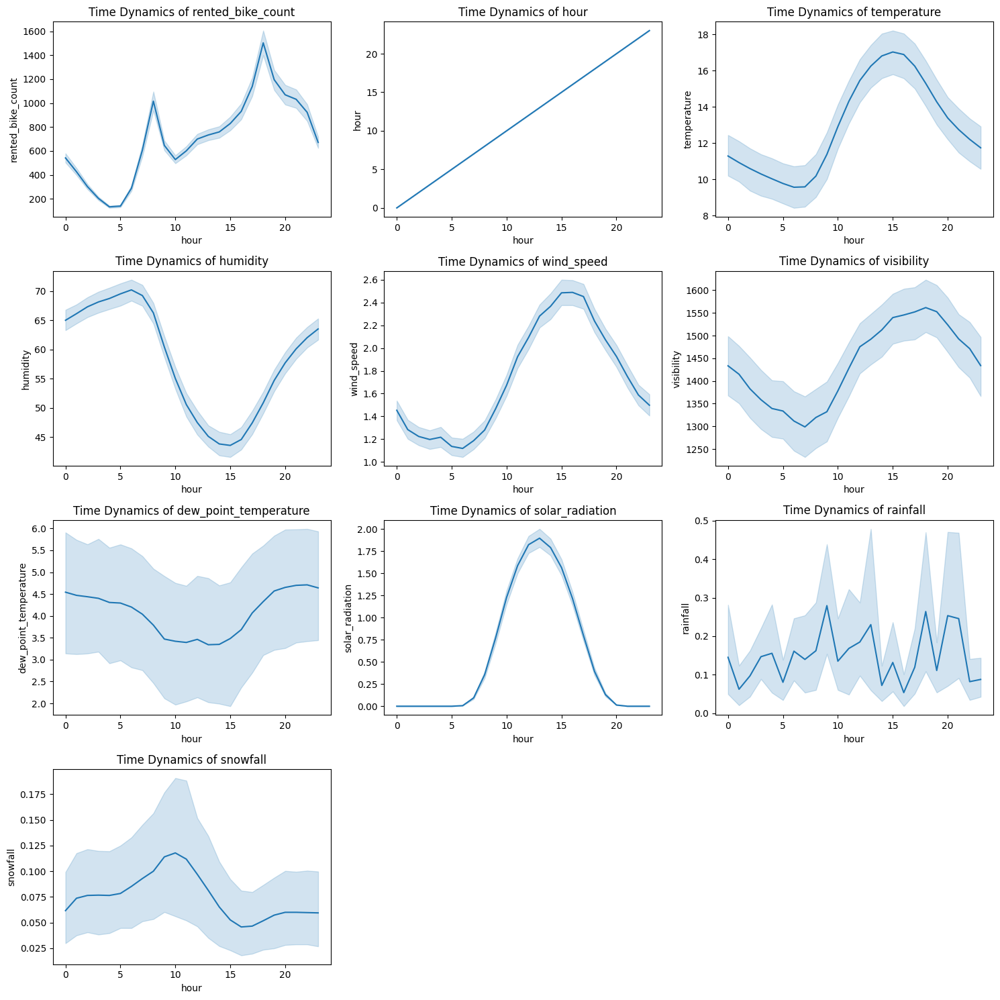

In [88]:
# посмотрим на временные динамики
plt.figure(figsize=(15, 15))

num_plots = len(df_numeric)
num_cols = 3
num_rows = (num_plots // num_cols) + (num_plots % num_cols)
for i, col in enumerate(df_numeric):
    plt.subplot(num_rows, num_cols, i + 1)
    sns.lineplot(x='hour', y=col, data=df)
    plt.title(f'Time Dynamics of {col}')

plt.tight_layout()
plt.show()

1. **Количество арендованных велосипедов (rented_bike_count):**

Распределение количества арендованных велосипедов - ассиметричное, скошенное вправо. Это говорит, что чаще всего спрос на велосипеды низкий.Также есть резкий перепад частот в районе 400-500 шт, что может указывать на примерный средний уровень спроса в обычные дни, выпадающие значения высокого спроса могут быть связаны с праздниками.

2. Часы (**hour**). Видим, что есть пиковые часы, когда спрос особенно высок (утро и вечер) - вероятно это обеденное время и вечернее время прогулок или возвращения с работы (после 23 часов и до часа ночи)

3. Темпратура (**temperature**). Пик аренды приходится на теплую погоду - примерно с +18 до +26 гадусов. При температуре ниже нуля и выше 30 спрос резко падает. Также заметен пик аренды при теплой погоде в течение дня (часы в районе 15-18). При низких температурах и в часы дневной жары спрос снижается.

4. Влажость (**humidity**) - распределение нормальное с небольшим перекосом вправо. На первый взгляд, влажность не оказывает сильного влияния на количество арендованных велосипедов. Пик в точке около 50 может говорить об оптимальной влажности для катания. Однако, при более высокой влажности (более 60-70%) видим снижение спроса.

5. Скорость ветра (**wind_speed**) - с усилением ветра спрос снижается.

6. Видимость (**visibility**). Наблюдаем высокий спрос только при высокой видмиости (это  отсутствие туманов и осадков, а также в светлое время суток), он резко падает при любых ухудшениях видимости.

7. Температура точки росы (**dew_point_temperature**). Похоже, что температура точки росы оказывает влияние на аренду велосипедов, с пиком спроса при значениях в районе 3-4 °C. Возможно, она связана с температурой воздуха, видимостью, осадками и др. факторами. При температуре ниже 0 и выше +25 спрос сильно снижается.

8. Солнечная радиация (**solar_radiation**). Люди арендуют много велосипедов при низкой солнечной радиации, при палящем солнце люди не катаются на байках. Но так как солнечная радиация в течение дня довольная предсказуема и стремится к значению 0, нельзя сказать, что она сильно влияет на аренду.

9. **Осадки (rainfall, snowfall)**. Пик аренды приходится на время без осадков (снег и дождь), во время осадков спрос резко падает практически до 0.



---



Нам не нужны (и даже вредны) данные за дни, когда прокат не работал, ведь они не отражают реальный спрос на велосипеды. Так что удалим данные за нерабочие дни

In [89]:
df['functioning_day'].unique()

array(['Yes', 'No'], dtype=object)

In [90]:
# удалим данные за дни, когда прокат не работал
non_functioning_days = df[df['functioning_day'] == 'No']
df = df[df['functioning_day'] == 'Yes']
print(f"Удалено нерабочих дней: {len(non_functioning_days)}")
df['functioning_day'].unique()

Удалено нерабочих дней: 295


array(['Yes'], dtype=object)

Теперь отпадает необходимость в самой колонке functioning_day, так как там остались только рабочие дни

In [91]:
# удалим столбец functioning_day
df = df.drop('functioning_day', axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8465 entries, 0 to 8759
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   date                   8465 non-null   datetime64[ns]
 1   rented_bike_count      8465 non-null   int64         
 2   hour                   8465 non-null   int64         
 3   temperature            8465 non-null   float64       
 4   humidity               8465 non-null   int64         
 5   wind_speed             8465 non-null   float64       
 6   visibility             8465 non-null   int64         
 7   dew_point_temperature  8465 non-null   float64       
 8   solar_radiation        8465 non-null   float64       
 9   rainfall               8465 non-null   float64       
 10  snowfall               8465 non-null   float64       
 11  seasons                8465 non-null   object        
 12  holiday                8465 non-null   object        
dtypes: 

Проанализируем, как менялось количество арендованных велосипедов в течение года

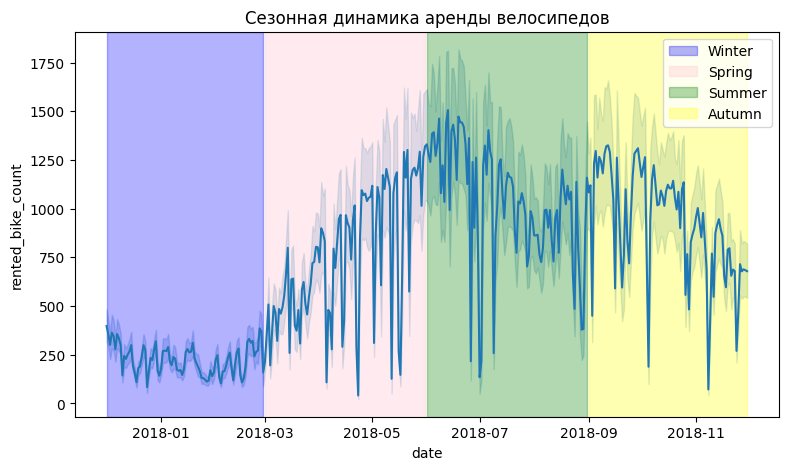

In [92]:
# анализ спроса в течение года
plt.figure(figsize=(20, 5))

# график аренды велосипедов
plt.subplot(1, 2, 1)
sns.lineplot(x='date', y='rented_bike_count', data=df)

# используем информацию о сезонах для выделения временных периодов
winter_period = df[df['seasons'] == 'Winter']
spring_period = df[df['seasons'] == 'Spring']
summer_period = df[df['seasons'] == 'Summer']
autumn_period = df[df['seasons'] == 'Autumn']

plt.axvspan(winter_period['date'].min(), winter_period['date'].max(), color='blue', alpha=0.3, label='Winter')
plt.axvspan(spring_period['date'].min(), spring_period['date'].max(), color='pink', alpha=0.3, label='Spring')
plt.axvspan(summer_period['date'].min(), summer_period['date'].max(), color='green', alpha=0.3, label='Summer')
plt.axvspan(autumn_period['date'].min(), autumn_period['date'].max(), color='yellow', alpha=0.3, label='Autumn')

plt.title('Сезонная динамика аренды велосипедов')
plt.legend()
plt.show()


В зимнее время (декабрь-январь) наблюдается очень низкий спрос. Устойчивый рост спроса начинается с апреля и остается высоким до октября включительно. Пик спроса приходится на июнь и чуть меньше в сентябре, а в самый жаркий месяц (в Сеуле в августе 40+) количество арендованных велосипедов немного падает.

Также по графику видно, что спрос скорее зависит не от сезона, а от конкретного месяца. Например, кол-во арендованных велосипедов в мае больше, чем в августе из-за более приятных погодных условий.

In [93]:
print(f'В мае арендовано: {df[df["date"].dt.month == 5]["rented_bike_count"].sum()}')
print(f'В августе арендовано: {df[df["date"].dt.month == 8]["rented_bike_count"].sum()}')

В мае арендовано: 707088
В августе арендовано: 651887


Поэтому для обучения модели будет полезнее знать месяц, а не сезон.

Знание конкретной даты (числа) нам также не нужно для прогнозирования спроса. Важно знать только был ли этот день выходным (праздником) или рабочим, эти данные есть в holiday

Так что мы можем создать отдельный столбец "month" и удалить колонки date и seasons

Возможно, на спрос может также может влиять день недели. Создадим столбец "day_of_week" (позже изучим, влияет ли он на спрос на самом деле)

In [94]:
df['month'] = df['date'].dt.month
df['day_of_week'] = df['date'].dt.day_name()
df.head(3)

,date,rented_bike_count,hour,temperature,humidity,wind_speed,visibility,dew_point_temperature,solar_radiation,rainfall,snowfall,seasons,holiday,month,day_of_week
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,12,Friday
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,12,Friday
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,12,Friday


In [95]:
# удалим колонки с датой и сезоном
df = df.drop(['seasons', 'date'], axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8465 entries, 0 to 8759
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   rented_bike_count      8465 non-null   int64  
 1   hour                   8465 non-null   int64  
 2   temperature            8465 non-null   float64
 3   humidity               8465 non-null   int64  
 4   wind_speed             8465 non-null   float64
 5   visibility             8465 non-null   int64  
 6   dew_point_temperature  8465 non-null   float64
 7   solar_radiation        8465 non-null   float64
 8   rainfall               8465 non-null   float64
 9   snowfall               8465 non-null   float64
 10  holiday                8465 non-null   object 
 11  month                  8465 non-null   int64  
 12  day_of_week            8465 non-null   object 
dtypes: float64(6), int64(5), object(2)
memory usage: 925.9+ KB


In [96]:
df.describe()

,rented_bike_count,hour,temperature,humidity,wind_speed,visibility,dew_point_temperature,solar_radiation,rainfall,snowfall,month
count,8465.000000,8465.000000,8465.000000,8465.000000,8465.000000,8465.000000,8465.000000,8465.000000,8465.00000,8465.000000,8465.000000
mean,729.156999,11.507029,12.771057,58.147194,1.725883,1433.873479,3.944997,0.567868,0.14912,0.077685,6.438984
std,642.351166,6.920899,12.104375,20.484839,1.034281,609.051229,13.242399,0.868245,1.12554,0.444063,3.452362
min,2.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.00000,0.000000,1.000000
25%,214.000000,6.000000,3.000000,42.000000,0.900000,935.000000,-5.100000,0.000000,0.00000,0.000000,3.000000
50%,542.000000,12.000000,13.500000,57.000000,1.500000,1690.000000,4.700000,0.010000,0.00000,0.000000,6.000000
75%,1084.000000,18.000000,22.700000,74.000000,2.300000,2000.000000,15.200000,0.930000,0.00000,0.000000,9.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.00000,8.800000,12.000000


Изучим взаимодействие переменных с помощью корреляций

Так как в данных много выбросов, используем метод Спирмена

<ipython-input-97-10e73e9eb2f2>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  spearman_corr = df.corr(method='spearman')


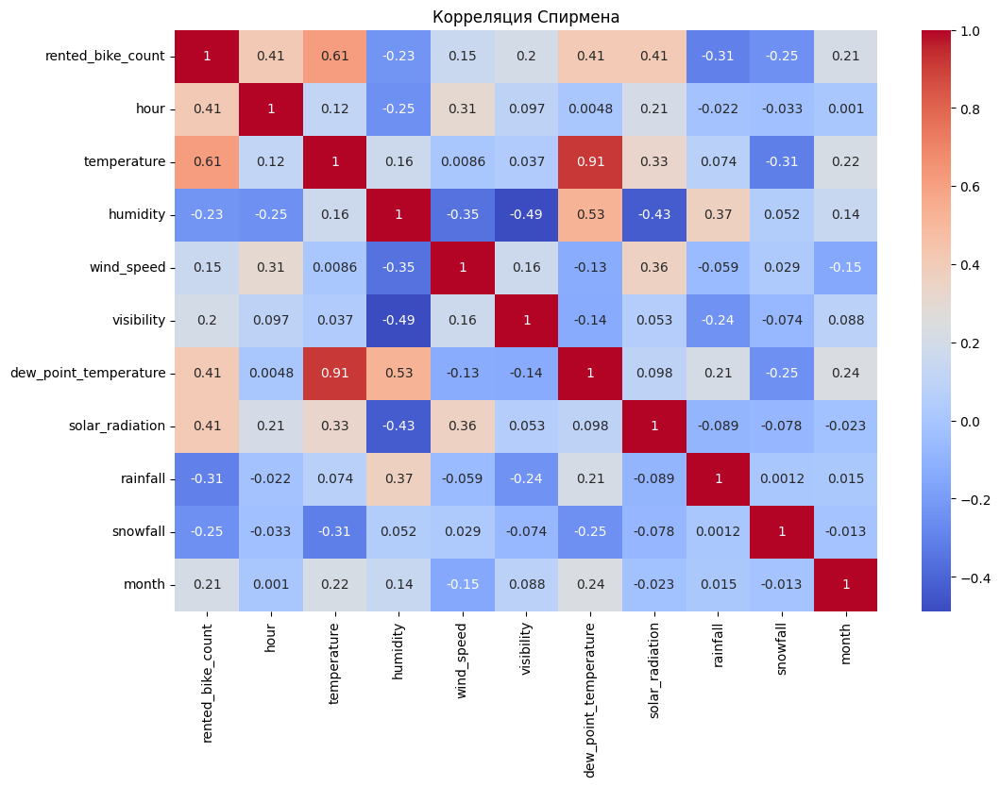

In [97]:
# корреляция методом Спирмена
spearman_corr = df.corr(method='spearman')

plt.figure(figsize=(12, 8))
sns.heatmap(spearman_corr, annot=True, cmap='coolwarm')
plt.title('Корреляция Спирмена')
plt.show()

На тепловой карте видно, что dew_point_temperature имеет критично высокую корреляцию с temperature (0.91), что может привести к мультиколлинеарности.

Температура точки росы (**dew_point_temperature**) - это вычисляемая переменная. И рассчитывается она исходя из температуры воздуха Т (°С) и его относительной влажности Rh (%)

Тр = (b*f(T, Rh))/(a-ƒ(T, Rh))

**Логично отбросить переменную dew_point_temperature для повышения эффективности обучения модели.**



In [98]:
df = df.drop('dew_point_temperature', axis=1)
df.head(1)

,rented_bike_count,hour,temperature,humidity,wind_speed,visibility,solar_radiation,rainfall,snowfall,holiday,month,day_of_week
0,254,0,-5.2,37,2.2,2000,0.0,0.0,0.0,No Holiday,12,Friday


Теперь исследуем категориальные переменные. Нужно отметить, что hour и month тоже являются категориальными значениями, несмотря на то, что представлены в виде чисел, но мы смогли изучить их ранее и сейчас исследовть не будем

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8465 entries, 0 to 8759
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   rented_bike_count  8465 non-null   int64  
 1   hour               8465 non-null   int64  
 2   temperature        8465 non-null   float64
 3   humidity           8465 non-null   int64  
 4   wind_speed         8465 non-null   float64
 5   visibility         8465 non-null   int64  
 6   solar_radiation    8465 non-null   float64
 7   rainfall           8465 non-null   float64
 8   snowfall           8465 non-null   float64
 9   holiday            8465 non-null   object 
 10  month              8465 non-null   int64  
 11  day_of_week        8465 non-null   object 
dtypes: float64(5), int64(5), object(2)
memory usage: 859.7+ KB


In [99]:
print(df['holiday'].value_counts())
print()
print(df['day_of_week'].value_counts())
print()
print(df['month'].value_counts())

No Holiday    8057
Holiday        408
Name: holiday, dtype: int64

Monday       1248
Friday       1224
Sunday       1224
Saturday     1217
Wednesday    1200
Thursday     1200
Tuesday      1152
Name: day_of_week, dtype: int64

12    744
1     744
3     744
7     744
8     744
5     720
6     720
4     696
2     672
10    665
11    648
9     624
Name: month, dtype: int64


Нет ошибочных или пустых категорий. Посмотрим на распределения

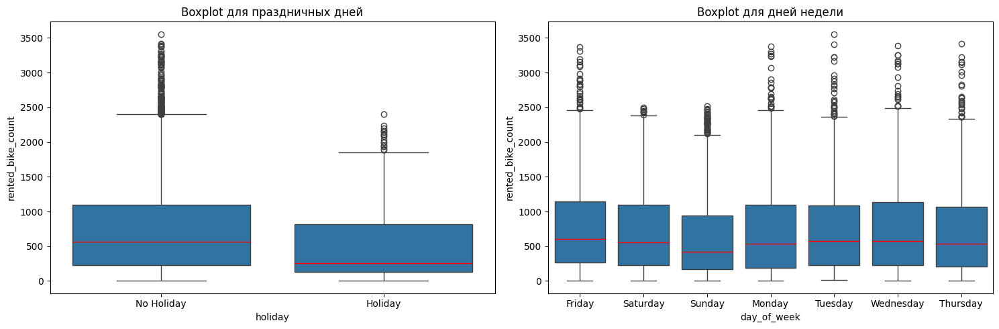

In [100]:
# исследуем категориальные переменные и отметим медианы
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# boxplot для выходных/рабочих дней
sns.boxplot(x='holiday', y='rented_bike_count', data=df, ax=axes[0], medianprops={'color':'red'})
axes[0].set_title('Boxplot для праздничных дней')

# boxplot для дней недели
sns.boxplot(x='day_of_week', y='rented_bike_count', data=df, ax=axes[1], medianprops={'color':'red'})
axes[1].set_title('Boxplot для дней недели')

plt.tight_layout()
plt.show()

Видим, что средние значения (медианы) отличаются для выходных и будних дней, а также для разных дней недели. Причем в выходные спрос меньше. Если взять во внимание распределение аренды по часам, можно предположить, что велосипеды чаще всего берут в обеденное время (12) и после рааботы/учебы (доехать домой или съездить куда-то отдохнуть)

Это значит, что день недели и выходные могут влиять на спрос на аренду.

**Мы проверили данные на пропуски, дубликаты и выбросы. Отбросили ненужные переменные и добавили новые. Данные готовы к преобразованиям для обучения (кодированию и масштабированию)**

# 3. Преобразование данных

### Кодирование категориальных данных

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8465 entries, 0 to 8759
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   rented_bike_count  8465 non-null   int64  
 1   hour               8465 non-null   int64  
 2   temperature        8465 non-null   float64
 3   humidity           8465 non-null   int64  
 4   wind_speed         8465 non-null   float64
 5   visibility         8465 non-null   int64  
 6   solar_radiation    8465 non-null   float64
 7   rainfall           8465 non-null   float64
 8   snowfall           8465 non-null   float64
 9   holiday            8465 non-null   object 
 10  month              8465 non-null   int64  
 11  day_of_week        8465 non-null   object 
dtypes: float64(5), int64(5), object(2)
memory usage: 859.7+ KB


В нашем датасете категориальными являются следующие переменные:

* hour - часы суток.
* holiday - информация о том, является ли день праздничным.
* month - месяц.
* day_of_week - день недели.

Закодируем их методом One-Hot_Encoding, но для начала разделим данные на тренировочную и тестовую выборку, чтобы избежать утечки информации из тестового набора.

In [102]:
X = df.drop('rented_bike_count', axis=1)
y = df['rented_bike_count']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [104]:
# сохраним значения для baseline модели
X_train_base = X_train.copy()
X_test_base = X_test.copy()

In [46]:
print(f'Размер X_train: {X_train.shape}')
print(f'Размер X_test: {X_test.shape}')
print(f'Размер y_train: {y_train.shape}')
print(f'Размер y_test: {y_test.shape}')

Размер X_train: (6348, 14)
Размер X_test: (2117, 14)
Размер y_train: (6348,)
Размер y_test: (2117,)


In [105]:
# one-hot encoding
X_train = pd.get_dummies(X_train, columns=['hour', 'holiday', 'month', 'day_of_week'])
X_test = pd.get_dummies(X_test, columns=['hour', 'holiday', 'month', 'day_of_week'])

X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6348 entries, 1164 to 7469
Data columns (total 52 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   temperature            6348 non-null   float64
 1   humidity               6348 non-null   int64  
 2   wind_speed             6348 non-null   float64
 3   visibility             6348 non-null   int64  
 4   solar_radiation        6348 non-null   float64
 5   rainfall               6348 non-null   float64
 6   snowfall               6348 non-null   float64
 7   hour_0                 6348 non-null   uint8  
 8   hour_1                 6348 non-null   uint8  
 9   hour_2                 6348 non-null   uint8  
 10  hour_3                 6348 non-null   uint8  
 11  hour_4                 6348 non-null   uint8  
 12  hour_5                 6348 non-null   uint8  
 13  hour_6                 6348 non-null   uint8  
 14  hour_7                 6348 non-null   uint8  
 15  h

In [106]:
# переименуем столбы с днями недели и выходными
X_train = X_train.rename(columns=lambda x: x.split('_')[3] if 'day_of_week_' in x else (x.split('_')[1] if 'holiday_' in x else x))
X_test = X_test.rename(columns=lambda x: x.split('_')[3] if 'day_of_week_' in x else (x.split('_')[1] if 'holiday_' in x else x))
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2117 entries, 5993 to 5240
Data columns (total 52 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   temperature      2117 non-null   float64
 1   humidity         2117 non-null   int64  
 2   wind_speed       2117 non-null   float64
 3   visibility       2117 non-null   int64  
 4   solar_radiation  2117 non-null   float64
 5   rainfall         2117 non-null   float64
 6   snowfall         2117 non-null   float64
 7   hour_0           2117 non-null   uint8  
 8   hour_1           2117 non-null   uint8  
 9   hour_2           2117 non-null   uint8  
 10  hour_3           2117 non-null   uint8  
 11  hour_4           2117 non-null   uint8  
 12  hour_5           2117 non-null   uint8  
 13  hour_6           2117 non-null   uint8  
 14  hour_7           2117 non-null   uint8  
 15  hour_8           2117 non-null   uint8  
 16  hour_9           2117 non-null   uint8  
 17  hour_10    

In [107]:
# переименуем месяцы
month_mapping = {
    'month_1': 'January',
    'month_2': 'February',
    'month_3': 'March',
    'month_4': 'April',
    'month_5': 'May',
    'month_6': 'June',
    'month_7': 'July',
    'month_8': 'August',
    'month_9': 'September',
    'month_10': 'October',
    'month_11': 'November',
    'month_12': 'December'
}

X_train = X_train.rename(columns=month_mapping)
X_test = X_test.rename(columns=month_mapping)
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6348 entries, 1164 to 7469
Data columns (total 52 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   temperature      6348 non-null   float64
 1   humidity         6348 non-null   int64  
 2   wind_speed       6348 non-null   float64
 3   visibility       6348 non-null   int64  
 4   solar_radiation  6348 non-null   float64
 5   rainfall         6348 non-null   float64
 6   snowfall         6348 non-null   float64
 7   hour_0           6348 non-null   uint8  
 8   hour_1           6348 non-null   uint8  
 9   hour_2           6348 non-null   uint8  
 10  hour_3           6348 non-null   uint8  
 11  hour_4           6348 non-null   uint8  
 12  hour_5           6348 non-null   uint8  
 13  hour_6           6348 non-null   uint8  
 14  hour_7           6348 non-null   uint8  
 15  hour_8           6348 non-null   uint8  
 16  hour_9           6348 non-null   uint8  
 17  hour_10    

Мы переименовали столбцы дней недели и месяцев, часы оставим как есть

Для holiday мы можем удалить один столбец. Оставим столбец с "Yes", чтобы 1 - соответствовала наличию выходного дня.



In [108]:
X_train = X_train.drop(columns='No Holiday')
X_test = X_test.drop(columns='No Holiday')
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2117 entries, 5993 to 5240
Data columns (total 51 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   temperature      2117 non-null   float64
 1   humidity         2117 non-null   int64  
 2   wind_speed       2117 non-null   float64
 3   visibility       2117 non-null   int64  
 4   solar_radiation  2117 non-null   float64
 5   rainfall         2117 non-null   float64
 6   snowfall         2117 non-null   float64
 7   hour_0           2117 non-null   uint8  
 8   hour_1           2117 non-null   uint8  
 9   hour_2           2117 non-null   uint8  
 10  hour_3           2117 non-null   uint8  
 11  hour_4           2117 non-null   uint8  
 12  hour_5           2117 non-null   uint8  
 13  hour_6           2117 non-null   uint8  
 14  hour_7           2117 non-null   uint8  
 15  hour_8           2117 non-null   uint8  
 16  hour_9           2117 non-null   uint8  
 17  hour_10    

### Масштабирование признаков

Для обучения линейной регрессии нам необходимо масштабировать значения признаков, но для модели дерева решений и случайный лес этого не требуется. Сделаем масштабирование для регрессий

In [109]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_test_scaled

array([[ 1.89744143, -0.69962324,  0.64961225, ..., -0.40723485,
         2.53125158, -0.40670893],
       [ 1.27337405,  0.71216965,  0.35933078, ..., -0.40723485,
        -0.39506148,  2.45876087],
       [ 1.33162034,  1.00426473, -0.41475314, ..., -0.40723485,
        -0.39506148, -0.40670893],
       ...,
       [-0.1411787 , -0.74830575,  0.26257029, ...,  2.45558554,
        -0.39506148, -0.40670893],
       [ 0.80740373,  1.05294724, -0.60827412, ..., -0.40723485,
        -0.39506148, -0.40670893],
       [ 0.69923205, -0.31016313, -0.12447167, ..., -0.40723485,
        -0.39506148, -0.40670893]])

In [110]:
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)
X_test_scaled.head()

,temperature,humidity,wind_speed,visibility,solar_radiation,rainfall,snowfall,hour_0,hour_1,hour_2,...,October,November,December,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
0,1.897441,-0.699623,0.649612,0.705128,1.296669,-0.135695,-0.175249,-0.208309,-0.204993,-0.203739,...,-0.292403,-0.291131,-0.304918,-0.412217,-0.413523,-0.408023,-0.414829,-0.407235,2.531252,-0.406709
1,1.273374,0.712170,0.359331,-0.167711,0.349723,-0.135695,-0.175249,-0.208309,-0.204993,-0.203739,...,-0.292403,-0.291131,-0.304918,-0.412217,-0.413523,-0.408023,-0.414829,-0.407235,-0.395061,2.458761
2,1.331620,1.004265,-0.414753,0.090545,-0.654962,-0.135695,-0.175249,-0.208309,-0.204993,-0.203739,...,-0.292403,-0.291131,-0.304918,-0.412217,-0.413523,-0.408023,2.410635,-0.407235,-0.395061,-0.406709
3,-0.873418,-1.527226,0.456091,0.732915,0.407464,-0.135695,-0.175249,-0.208309,-0.204993,-0.203739,...,-0.292403,-0.291131,-0.304918,-0.412217,-0.413523,2.450841,-0.414829,-0.407235,-0.395061,-0.406709
4,0.990463,0.127979,-0.124472,0.933963,-0.654962,-0.135695,-0.175249,-0.208309,-0.204993,-0.203739,...,-0.292403,-0.291131,-0.304918,2.425909,-0.413523,-0.408023,-0.414829,-0.407235,-0.395061,-0.406709


# 4. Моделирование

## Линейная регрессия

### Baseline-модель (52%)

In [111]:
print("Количество строк в X_train:", X_train.shape[0])
print("Количество элементов в y_train:", len(y_train))

Количество строк в X_train: 6348
Количество элементов в y_train: 6348


In [112]:
X_train_base.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6348 entries, 1164 to 7469
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   hour             6348 non-null   int64  
 1   temperature      6348 non-null   float64
 2   humidity         6348 non-null   int64  
 3   wind_speed       6348 non-null   float64
 4   visibility       6348 non-null   int64  
 5   solar_radiation  6348 non-null   float64
 6   rainfall         6348 non-null   float64
 7   snowfall         6348 non-null   float64
 8   holiday          6348 non-null   object 
 9   month            6348 non-null   int64  
 10  day_of_week      6348 non-null   object 
dtypes: float64(5), int64(4), object(2)
memory usage: 595.1+ KB


Так как у нас есть 2 признака типа object - 'holiday' и 'day_of_week'. Для baseline - отбросим их

In [ ]:
X_train_base = X_train_base.drop(['holiday', 'day_of_week'], axis=1)
X_test_base = X_test_base.drop(['holiday', 'day_of_week'], axis=1)
X_test_base.head(3)

In [114]:
# baseline-модель
baseline_model = LinearRegression()
baseline_model.fit(X_train_base, y_train)

y_pred_base = baseline_model.predict(X_test_base)

# оценим модель
# расчет rmse
rmse_base = np.sqrt(mean_squared_error(y_test, y_pred_base))

print(f'RMSE: {rmse_base:.2f}')
print(f'Ср. абсолютная разница между фактическими и предсказанными значениями составляет примерно {rmse_base:.2f} единиц')
print()

# расчет Adjusted R2
r2_base = r2_score(y_test, y_pred_base)
num_predictors = X_test_base.shape[1]
num_observations = X_test_base.shape[0]
adjusted_r_2 = 1 - ((1 - r2_base) * (num_observations - 1) / (num_observations - num_predictors - 1))

print(f'Adjusted R2: {adjusted_r_2:.2f}')
print(f'{round(adjusted_r_2 * 100)}% изменчивости данных объясняется моделью')

RMSE: 432.87
Ср. абсолютная разница между фактическими и предсказанными значениями составляет примерно 432.87 единиц

Adjusted R2: 0.52
52% изменчивости данных объясняется моделью


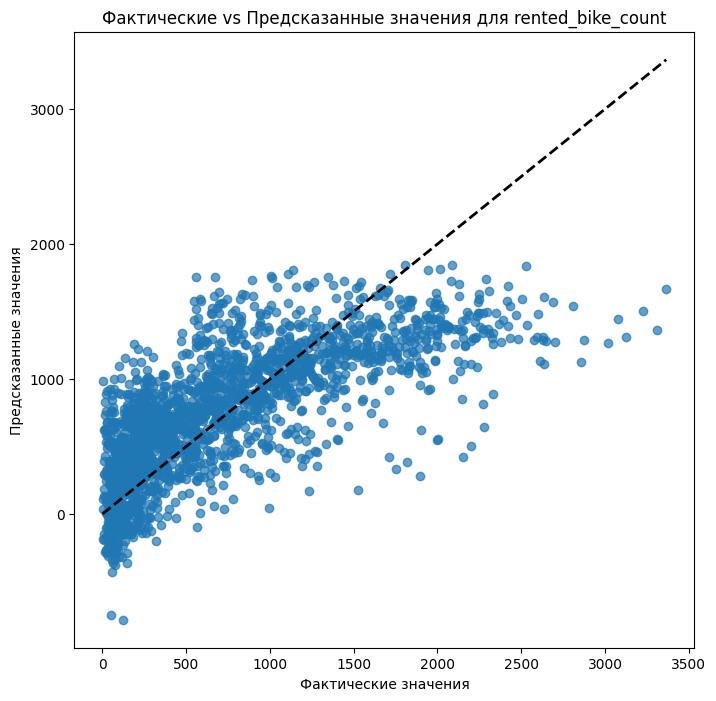

In [ ]:
# визуализация фактических и предсказанных значений для rented_bike_count (тестовый набор)
plt.figure(figsize=(8, 8))
plt.scatter(y_test, y_pred_base, alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='--', lw=2)
plt.xlabel('Фактические значения')
plt.ylabel('Предсказанные значения')
plt.title('Фактические vs Предсказанные значения для rented_bike_count')
plt.show()

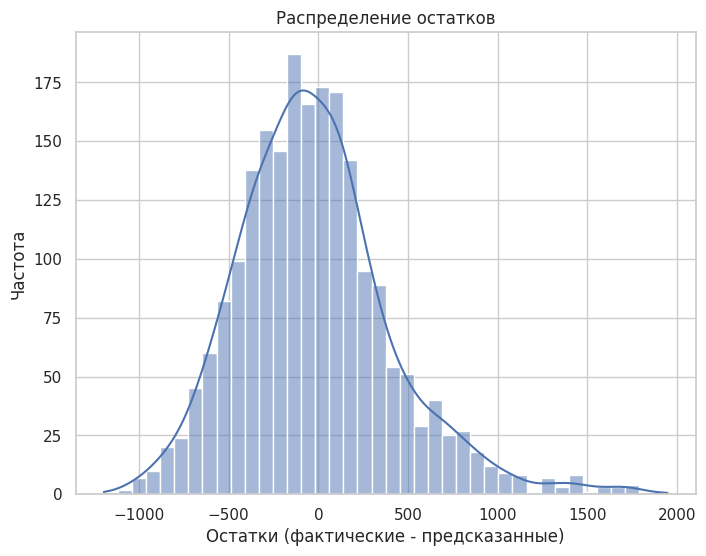

In [123]:
# график остатков
residuals = y_test - y_pred_base

plt.figure(figsize=(8, 6))
sns.histplot(residuals, kde=True)
plt.title('Распределение остатков')
plt.xlabel('Остатки (фактические - предсказанные)')
plt.ylabel('Частота')
plt.show()

 Распределение остатков отлично от нормального. Значение R2: 0.52 также указывает на то, что модель не улавливает все важные факторы (только 52% изменчивости данных объясняется baseline-моделью)

In [131]:
results = pd.DataFrame(columns=['Model', 'RMSE', 'Adjusted R2'])
results = results.append({'Model': 'baseline_model', 'RMSE': rmse_base, 'Adjusted R2': adjusted_r_2}, ignore_index=True)
results

<ipython-input-131-c8f12750fd65>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'Model': 'baseline_model', 'RMSE': rmse_base, 'Adjusted R2': adjusted_r_2}, ignore_index=True)


,Model,RMSE,Adjusted R2
0,baseline_model,432.869632,0.523527


### Лин. рег на основе всех признаков (68%)

In [148]:
lin_reg_all = LinearRegression()

# кросс-валидация
cv_scores = cross_val_score(lin_reg_all, X_train_scaled, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_all = np.sqrt(-cv_scores.mean())
print(f'RMSE на кросс-валидации: {cv_rmse_all:.2f}')

RMSE на кросс-валидации: 352.97


In [122]:
# предсказываем на тестовом наборе
lin_reg_all.fit(X_train_scaled, y_train)
y_pred_all = lin_reg_all.predict(X_test_scaled)

# оцениваем модель на тесте
rmse_lin_reg_all = np.sqrt(mean_squared_error(y_test, y_pred_all))
print(f'RMSE на тестовом наборе: {rmse_lin_reg_all:.2f}')

# расчет Adjusted R2
r2_lin_reg_all = r2_score(y_test, y_pred_all)
num_predictors_lin_reg_all = X_test_scaled.shape[1]
num_observations_lin_reg_all = X_test_scaled.shape[0]
adjusted_r_2_lin_reg_all = 1 - ((1 - r2_lin_reg_all) * (num_observations_lin_reg_all - 1) /
                                (num_observations_lin_reg_all - num_predictors_lin_reg_all - 1))
print(f'Adjusted R2 на тестовом наборе: {adjusted_r_2_lin_reg_all:.2f}')
print(f'{round(adjusted_r_2_lin_reg_all * 100)}% изменчивости данных объясняется моделью')

RMSE на тестовом наборе: 350.36
Adjusted R2 на тестовом наборе: 0.68
68% изменчивости данных объясняется моделью


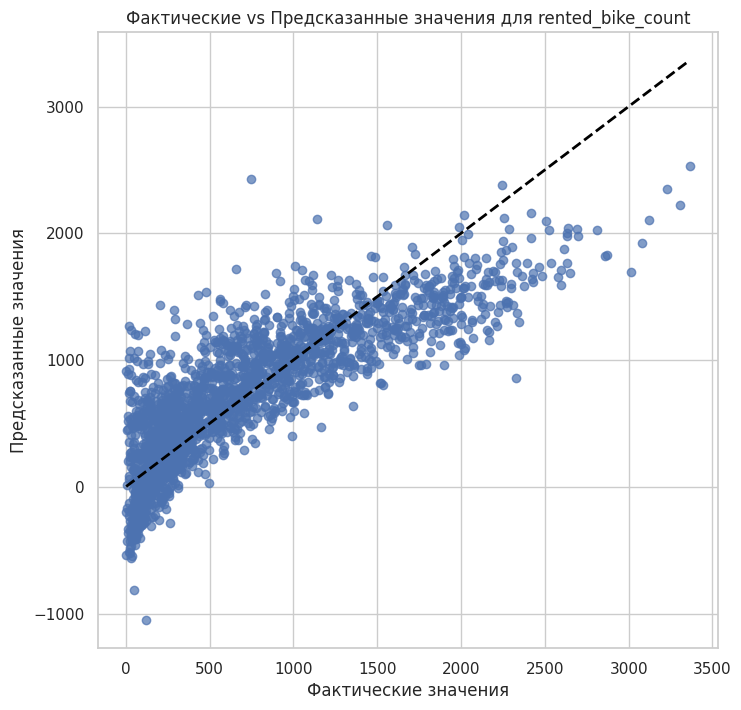

In [124]:
# визуализация фактических и предсказанных значений для rented_bike_count (тестовый набор)
plt.figure(figsize=(8, 8))
plt.scatter(y_test, y_pred_all, alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='--', lw=2)
plt.xlabel('Фактические значения')
plt.ylabel('Предсказанные значения')
plt.title('Фактические vs Предсказанные значения для rented_bike_count')
plt.show()

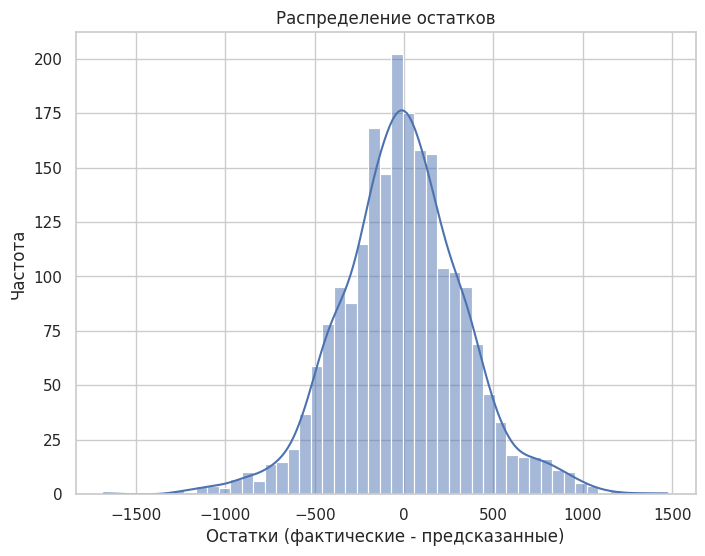

In [126]:
# график остатков
residuals = y_test - y_pred_all

plt.figure(figsize=(8, 6))
sns.histplot(residuals, kde=True)
plt.title('Распределение остатков')
plt.xlabel('Остатки (фактические - предсказанные)')
plt.ylabel('Частота')
plt.show()

Распределение остатков близко к нормальному, но всего 68% изменчивости в данных по аренде велосипедов объясняется использованной моделью.

In [132]:
results = results.append({'Model': 'lin_reg_all', 'RMSE': rmse_lin_reg_all, 'Adjusted R2': adjusted_r_2_lin_reg_all}, ignore_index=True)
results

<ipython-input-132-4b5f08beea29>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'Model': 'lin_reg_all', 'RMSE': rmse_lin_reg_all, 'Adjusted R2': adjusted_r_2_lin_reg_all}, ignore_index=True)


,Model,RMSE,Adjusted R2
0,baseline_model,432.869632,0.523527
1,lin_reg_all,350.359145,0.681510


### Полиномиальная регрессия на всех признаках (60%)

In [146]:
poly_features = PolynomialFeatures(degree=2)
X_train_poly = poly_features.fit_transform(X_train_scaled)

lin_reg_poly = LinearRegression()

# оцениваем модель на кросс-валидации
# RMSE на кросс-валидации
cv_scores_poly = cross_val_score(lin_reg_poly, X_train_poly, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_poly = np.sqrt(-cv_scores_poly.mean())
print(f'RMSE на кросс-валидации (полиномиальная регрессия): {cv_rmse_poly:.2f}')

# обучаем модель
lin_reg_poly.fit(X_train_poly, y_train)

# делаем предсказание
X_test_poly = poly_features.transform(X_test_scaled)
y_pred_poly = lin_reg_poly.predict(X_test_poly)

RMSE на кросс-валидации (полиномиальная регрессия): 265.08


In [147]:
# оценка модели на тестовом наборе
rmse_poly = np.sqrt(mean_squared_error(y_test, y_pred_poly))
print(f'RMSE на тестовом наборе (полиномиальная регрессия): {rmse_poly:.2f}')

# расчет Adjusted R2 на тестовом наборе
r2_poly = r2_score(y_test, y_pred_poly)
num_predictors_poly = X_test_poly.shape[1]
num_observations_poly = X_test_poly.shape[0]
adjusted_r2_poly = 1 - ((1 - r2_poly) * (num_observations_poly - 1) /
                        (num_observations_poly - num_predictors_poly - 1))
print(f'Adjusted R2 на тестовом наборе (полиномиальная регрессия): {adjusted_r2_poly:.2f}')
print(f'{round(adjusted_r2_poly * 100)}% изменчивости данных объясняется моделью (полиномиальная регрессия)')

RMSE на тестовом наборе (полиномиальная регрессия): 233.82
Adjusted R2 на тестовом наборе (полиномиальная регрессия): 0.60
60% изменчивости данных объясняется моделью (полиномиальная регрессия)


На полиномиальных признаках качество модели ухудшилось до 60%

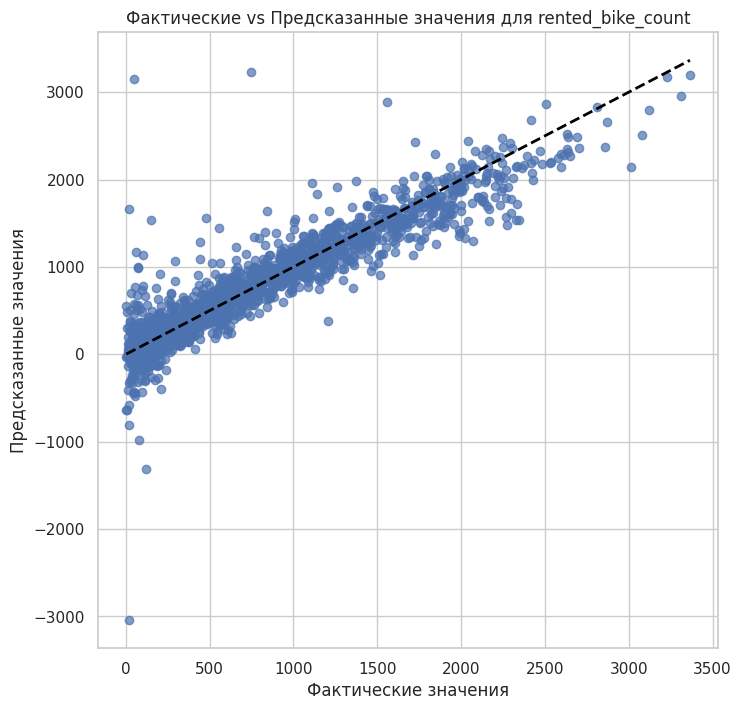

In [149]:
# визуализация фактических и предсказанных значений для rented_bike_count (тестовый набор)
plt.figure(figsize=(8, 8))
plt.scatter(y_test, y_pred_poly, alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='--', lw=2)
plt.xlabel('Фактические значения')
plt.ylabel('Предсказанные значения')
plt.title('Фактические vs Предсказанные значения для rented_bike_count')
plt.show()

In [152]:
results = results.append({'Model': 'lin_reg_poly', 'RMSE': rmse_poly, 'Adjusted R2': adjusted_r2_poly}, ignore_index=True)
results

<ipython-input-152-bef7cf3e31b9>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'Model': 'lin_reg_poly', 'RMSE': rmse_poly, 'Adjusted R2': adjusted_r2_poly}, ignore_index=True)


,Model,RMSE,Adjusted R2
0,baseline_model,432.869632,0.523527
1,lin_reg_all,350.359145,0.681510
2,lin_reg_poly,233.819285,0.603089


----

### Лин. рег. на наиболее информативных признаках (68%)

Попробуем исключить менее информативные признаки из модели lin_reg_all и посмотрим на результаты

In [163]:
lin_reg_all.fit(X_train_scaled, y_train)

# получаем коэффициенты и интерсепт
coefficients = lin_reg_all.coef_
intercept = lin_reg_all.intercept_

# создаем DataFrame с коэффициентами и соответствующими признаками
coef_df = pd.DataFrame({'Feature': X_train_scaled.columns, 'Coefficient': coefficients})

# сортируем по абсолютному значению коэффициента
coef_df['Abs_Coefficient'] = np.abs(coef_df['Coefficient'])
coef_df = coef_df.sort_values('Abs_Coefficient', ascending=False)

print('Наименее информативные признаки:')
print(coef_df.tail())

Наименее информативные признаки:
            Feature  Coefficient  Abs_Coefficient
4   solar_radiation    34.437680        34.437680
31          Holiday   -31.519728        31.519728
3        visibility    24.582549        24.582549
6          snowfall     9.622254         9.622254
2        wind_speed     2.747992         2.747992


In [164]:
X_train_reduced = X_train_scaled.drop(['solar_radiation', 'Holiday', 'visibility', 'snowfall', 'wind_speed'], axis=1)
X_test_reduced = X_test_scaled.drop(['solar_radiation', 'Holiday', 'visibility', 'snowfall', 'wind_speed'], axis=1)

lin_reg_reduced = LinearRegression()

# оценка на кросс-валидации
cv_scores_reduced = cross_val_score(lin_reg_reduced, X_train_reduced, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_reduced = np.sqrt(-cv_scores_reduced.mean())
print(f'RMSE на кросс-валидации (с уменьшенными признаками): {cv_rmse_reduced:.2f}')

RMSE на кросс-валидации (с уменьшенными признаками): 355.32


In [165]:
# предсказываем на тестовом наборе
lin_reg_reduced.fit(X_train_reduced, y_train)
y_pred_reduced = lin_reg_reduced.predict(X_test_reduced)

# оцениваем модель на тесте
# RMSE на тестовом наборе
rmse_lin_reg_reduced = np.sqrt(mean_squared_error(y_test, y_pred_reduced))
print(f'RMSE на тестовом наборе (с уменьшенными признаками): {rmse_lin_reg_reduced:.2f}')

# Adjusted R2 на тестовом наборе
r2_lin_reg_reduced = r2_score(y_test, y_pred_reduced)
num_predictors_lin_reg_reduced = X_test_reduced.shape[1]
num_observations_lin_reg_reduced = X_test_reduced.shape[0]
adjusted_r_2_lin_reg_reduced = 1 - ((1 - r2_lin_reg_reduced) * (num_observations_lin_reg_reduced - 1) /
                                    (num_observations_lin_reg_reduced - num_predictors_lin_reg_reduced - 1))
print(f'Adjusted R2 на тестовом наборе (с уменьшенными признаками): {adjusted_r_2_lin_reg_reduced:.2f}')
print(f'{round(adjusted_r_2_lin_reg_reduced * 100)}% изменчивости данных объясняется моделью (с уменьшенными признаками)')

RMSE на тестовом наборе (с уменьшенными признаками): 353.37
Adjusted R2 на тестовом наборе (с уменьшенными признаками): 0.68
68% изменчивости данных объясняется моделью (с уменьшенными признаками)


In [166]:
results = results.append({'Model': 'lin_reg_reduced', 'RMSE': rmse_lin_reg_reduced, 'Adjusted R2': adjusted_r_2_lin_reg_reduced}, ignore_index=True)
results

<ipython-input-166-fb367456c567>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'Model': 'lin_reg_reduced', 'RMSE': rmse_lin_reg_reduced, 'Adjusted R2': adjusted_r_2_lin_reg_reduced}, ignore_index=True)


,Model,RMSE,Adjusted R2
0,baseline_model,432.869632,0.523527
1,lin_reg_all,350.359145,0.681510
2,lin_reg_poly,233.819285,0.603089
3,lin_reg_reduced,353.369936,0.676796


Исключение наименее информативных признаков из lin_reg_all не дало улучшения результатов.

## Выводы по моделям лин. регрессии:

Наиболее низкое значение RMSE = 233 имеет модель линейной регрессии с полиномиальными признаками, пока у нее лучшая точность предсказаний и она точнее улавливает нелинейные зависимости.

Однако для нас наиболее важна метрика Adjusted R2, которая учитывает сложность модели. Лучшей на данный момент является модель на всех признаках lin_reg_all (Adjusted R2 = 0.68)

## Дерево решений (80%)

Сделаем подбор гиперпараметров, дающих лучшие результаты для дерева решений и построим модель на них

In [172]:
# определим целевую функцию для HyperOpt
def objective(params, X_train, y_train, X_test, y_test):
    model = DecisionTreeRegressor(**params, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    return {'loss': mse, 'status': STATUS_OK}

# определим пространство поиска для гиперпараметров
space_dt = {
    'criterion': hp.choice('criterion', ['squared_error', 'absolute_error', 'friedman_mse', 'poisson']),
    'max_features': hp.choice('max_features', ['auto', 'sqrt', 'log2']),
    'max_depth': hp.choice('max_depth', range(1, 20)),
    'min_samples_leaf': hp.choice('min_samples_leaf', range(1, 20))
}

# инициализация Trials для отслеживания процесса оптимизации
trials_dt = Trials()

best_dt = fmin(fn=lambda params: objective(params, X_train, y_train, X_test, y_test),
               space=space_dt, algo=tpe.suggest, max_evals=50, trials=trials_dt)

  8%|▊         | 4/50 [00:01<00:21,  2.18trial/s, best loss: 75678.51555168096] 

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(



 14%|█▍        | 7/50 [00:02<00:16,  2.56trial/s, best loss: 75678.51555168096]

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(



 16%|█▌        | 8/50 [00:03<00:15,  2.70trial/s, best loss: 75678.51555168096]

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(



 30%|███       | 15/50 [00:03<00:04,  7.02trial/s, best loss: 75678.51555168096]

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(



 42%|████▏     | 21/50 [00:05<00:08,  3.37trial/s, best loss: 75678.51555168096]

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(



 46%|████▌     | 23/50 [00:06<00:06,  4.03trial/s, best loss: 75678.51555168096]

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(



 50%|█████     | 25/50 [00:06<00:05,  5.00trial/s, best loss: 73508.84787865324]

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(



 54%|█████▍    | 27/50 [00:06<00:04,  5.22trial/s, best loss: 73508.84787865324]

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(



 58%|█████▊    | 29/50 [00:06<00:03,  6.25trial/s, best loss: 73508.84787865324]

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(



 62%|██████▏   | 31/50 [00:07<00:02,  7.25trial/s, best loss: 73508.84787865324]

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(



 70%|███████   | 35/50 [00:09<00:04,  3.09trial/s, best loss: 73508.84787865324]

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(



 78%|███████▊  | 39/50 [00:10<00:02,  4.18trial/s, best loss: 73508.84787865324]

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(



 88%|████████▊ | 44/50 [00:11<00:01,  5.42trial/s, best loss: 73508.84787865324]

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(



 92%|█████████▏| 46/50 [00:11<00:00,  6.55trial/s, best loss: 73508.84787865324]

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(



100%|██████████| 50/50 [00:11<00:00,  4.21trial/s, best loss: 73508.84787865324]


/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(



In [173]:
print("Лучшие гиперпараметры для дерева решений:", best_dt)

Лучшие гиперпараметры для дерева решений: {'criterion': 2, 'max_depth': 18, 'max_features': 0, 'min_samples_leaf': 11}


In [174]:
# преобразование выбранных гиперпараметров из индексов в фактические значения
best_dt_params = {
    'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'][best_dt['criterion']],
    'max_depth': best_dt['max_depth'],
    'max_features': ['auto', 'sqrt', 'log2'][best_dt['max_features']],
    'min_samples_leaf': best_dt['min_samples_leaf']
}

# DecisionTreeRegressor с лучшими гиперпараметрами
dt_model = DecisionTreeRegressor(**best_dt_params, random_state=42)
dt_model.fit(X_train, y_train)

# предсказание на тестовом наборе
y_pred_dt = dt_model.predict(X_test)

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(


In [175]:
# оценка на кросс-валидации
cv_scores_dt = cross_val_score(dt_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_dt = np.sqrt(-cv_scores_dt.mean())
print(f'RMSE на кросс-валидации для Decision Tree: {cv_rmse_dt:.2f}')

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(


RMSE на кросс-валидации для Decision Tree: 282.97


/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(


In [179]:
# оценка модели на тестовом наборе
# RMSE
rmse_dt = np.sqrt(mean_squared_error(y_test, y_pred_dt))
print(f'RMSE для Decision Tree: {rmse_dt:.2f}')

# Adjusted R2
r2_dt = r2_score(y_test, y_pred_dt)
num_predictors_dt = X_test.shape[1]
num_observations_dt = X_test.shape[0]
adjusted_r2_dt = 1 - ((1 - r2_dt) * (num_observations_dt - 1) /
                       (num_observations_dt - num_predictors_dt - 1))
print(f'Adjusted R2 для Decision Tree: {adjusted_r2_dt:.2f}')
print(f'{round(adjusted_r2_dt * 100)}% изменчивости данных объясняется моделью (Decision Tree)')

RMSE для Decision Tree: 276.58
Adjusted R2 для Decision Tree: 0.80
80% изменчивости данных объясняется моделью (Decision Tree)


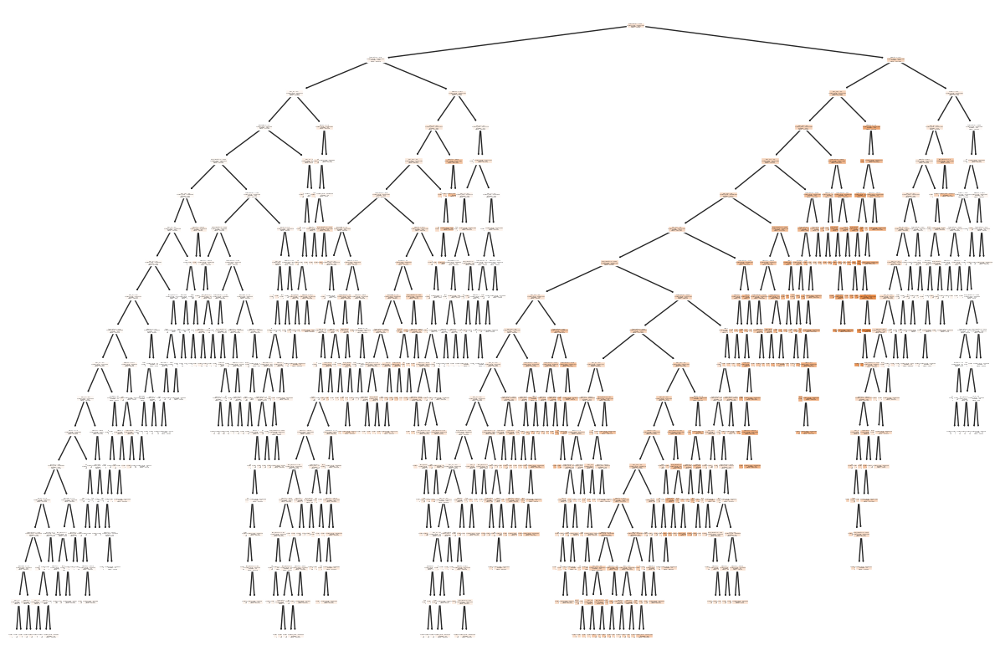

In [178]:
from sklearn.tree import plot_tree

plt.figure(figsize=(15, 10))
tree_graph = plot_tree(
    dt_model,
    feature_names=X_train.columns,
    filled=True
)

plt.show()


In [180]:
results = results.append({'Model': 'dt_model', 'RMSE': rmse_dt, 'Adjusted R2': adjusted_r2_dt}, ignore_index=True)
results

<ipython-input-180-3406e449cc10>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'Model': 'dt_model', 'RMSE': rmse_dt, 'Adjusted R2': adjusted_r2_dt}, ignore_index=True)


,Model,RMSE,Adjusted R2
0,baseline_model,432.869632,0.523527
1,lin_reg_all,350.359145,0.681510
2,lin_reg_poly,233.819285,0.603089
3,lin_reg_reduced,353.369936,0.676796
4,dt_model,276.575494,0.801530


### Случайный лес (87%)

In [181]:
# определение целевой функции для HyperOpt
def objective(params):
    model = RandomForestRegressor(**params, random_state=42, n_jobs=-1)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    return {'loss': mse, 'status': STATUS_OK}

# определение пространства поиска для гиперпараметров
space_rf = {
    'n_estimators': hp.choice('n_estimators', range(10, 101)),
    'max_depth': hp.choice('max_depth', range(1, 21)),
    'min_samples_split': hp.choice('min_samples_split', range(2, 11)),
    'min_samples_leaf': hp.choice('min_samples_leaf', range(1, 11)),
    'max_features': hp.choice('max_features', ['auto', 'sqrt', 'log2'])
}

# Trials для отслеживания процесса оптимизации
trials_rf = Trials()

# запуск оптимизации HyperOpt для случайного леса
best_rf = fmin(fn=objective, space=space_rf, algo=tpe.suggest, max_evals=50, trials=trials_rf)

  0%|          | 0/50 [00:00<?, ?trial/s, best loss=?]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



  4%|▍         | 2/50 [00:02<01:00,  1.25s/trial, best loss: 59436.43405009287]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 10%|█         | 5/50 [00:03<00:25,  1.74trial/s, best loss: 59436.43405009287]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 16%|█▌        | 8/50 [00:04<00:14,  2.84trial/s, best loss: 59436.43405009287]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 22%|██▏       | 11/50 [00:05<00:14,  2.76trial/s, best loss: 59436.43405009287]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 30%|███       | 15/50 [00:08<00:17,  1.97trial/s, best loss: 58060.51479494867]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 38%|███▊      | 19/50 [00:11<00:14,  2.13trial/s, best loss: 52214.602254563324]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 40%|████      | 20/50 [00:11<00:13,  2.24trial/s, best loss: 52214.602254563324]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 42%|████▏     | 21/50 [00:12<00:20,  1.44trial/s, best loss: 52214.602254563324]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 44%|████▍     | 22/50 [00:14<00:28,  1.02s/trial, best loss: 52214.602254563324]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 46%|████▌     | 23/50 [00:15<00:23,  1.14trial/s, best loss: 52214.602254563324]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 48%|████▊     | 24/50 [00:16<00:24,  1.05trial/s, best loss: 52214.602254563324]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 50%|█████     | 25/50 [00:16<00:21,  1.19trial/s, best loss: 52214.602254563324]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 52%|█████▏    | 26/50 [00:17<00:22,  1.09trial/s, best loss: 52214.602254563324]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 54%|█████▍    | 27/50 [00:19<00:29,  1.26s/trial, best loss: 49989.81512590001] 

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 56%|█████▌    | 28/50 [00:21<00:30,  1.40s/trial, best loss: 49989.81512590001]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 58%|█████▊    | 29/50 [00:24<00:41,  1.96s/trial, best loss: 49989.81512590001]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 62%|██████▏   | 31/50 [00:25<00:21,  1.14s/trial, best loss: 49989.81512590001]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 64%|██████▍   | 32/50 [00:26<00:16,  1.08trial/s, best loss: 49989.81512590001]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 68%|██████▊   | 34/50 [00:27<00:13,  1.23trial/s, best loss: 49989.81512590001]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 70%|███████   | 35/50 [00:29<00:17,  1.19s/trial, best loss: 49989.81512590001]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 74%|███████▍  | 37/50 [00:31<00:13,  1.02s/trial, best loss: 49989.81512590001]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 76%|███████▌  | 38/50 [00:32<00:12,  1.00s/trial, best loss: 49989.81512590001]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 78%|███████▊  | 39/50 [00:34<00:12,  1.16s/trial, best loss: 49989.81512590001]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 80%|████████  | 40/50 [00:34<00:09,  1.07trial/s, best loss: 49989.81512590001]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 84%|████████▍ | 42/50 [00:36<00:06,  1.16trial/s, best loss: 49989.81512590001]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 88%|████████▊ | 44/50 [00:38<00:05,  1.18trial/s, best loss: 49989.81512590001]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 94%|█████████▍| 47/50 [00:40<00:02,  1.28trial/s, best loss: 49989.81512590001]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



 98%|█████████▊| 49/50 [00:41<00:00,  1.73trial/s, best loss: 49989.81512590001]

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



100%|██████████| 50/50 [00:42<00:00,  1.17trial/s, best loss: 49465.709887494864]


In [182]:
print("Лучшие гиперпараметры для случайного леса:", best_rf)

# из индексов в фактические значения
best_params_rf = space_eval(space_rf, best_rf)

Лучшие гиперпараметры для случайного леса: {'max_depth': 18, 'max_features': 0, 'min_samples_leaf': 2, 'min_samples_split': 8, 'n_estimators': 22}


In [185]:
# RandomForestRegressor с лучшими гиперпараметрами
rf_model = RandomForestRegressor(**best_params_rf, random_state=42, n_jobs=-1)
rf_model.fit(X_train, y_train)

y_pred_rf = rf_model.predict(X_test)

# оценка на кросс-валидации
cv_scores_rf = cross_val_score(rf_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_rf = np.sqrt(-cv_scores_rf.mean())
print(f'RMSE на кросс-валидации для случайного леса: {cv_rmse_rf:.2f}')

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors

RMSE на кросс-валидации для случайного леса: 225.80


In [187]:
# оценка модели
# RMSE
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))
print(f'RMSE для случайного леса: {rmse_rf:.2f}')

# Adjusted R2 для случайного леса
r2_rf = r2_score(y_test, y_pred_rf)
num_predictors_rf = X_test.shape[1]
num_observations_rf = X_test.shape[0]
adjusted_r2_rf = 1 - ((1 - r2_rf) * (num_observations_rf - 1) /
                       (num_observations_rf - num_predictors_rf - 1))
print(f'Adjusted R2 для случайного леса: {adjusted_r2_rf:.2f}')
print(f'{round(adjusted_r2_rf * 100)}% изменчивости данных объясняется моделью')

RMSE для случайного леса: 222.41
Adjusted R2 для случайного леса: 0.87
87% изменчивости данных объясняется моделью


In [188]:
results = results.append({'Model': 'rf_model', 'RMSE': rmse_rf, 'Adjusted R2': adjusted_r2_rf}, ignore_index=True)
results

<ipython-input-188-6c6b864afeb2>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'Model': 'rf_model', 'RMSE': rmse_rf, 'Adjusted R2': adjusted_r2_rf}, ignore_index=True)


,Model,RMSE,Adjusted R2
0,baseline_model,432.869632,0.523527
1,lin_reg_all,350.359145,0.681510
2,lin_reg_poly,233.819285,0.603089
3,lin_reg_reduced,353.369936,0.676796
4,dt_model,276.575494,0.801530
5,rf_model,222.408880,0.871657


Пока самый лучший результат показывает модель случайного леса **rf_model**. Она продемонстрировала наилучшую производительность с наименьшим значением RMSE (222.41) и наивысшим Adjusted R2 (0.8717) среди всех рассмотренных моделей.

Это может свидетельствовать о том, что случайный лес лучше всего адаптируется к данным и способен предсказывать целевую переменную с наилучшей точностью среди рассмотренных моделей.

## Градиентный бустинг (92%)

In [202]:
import xgboost as xgb
from xgboost import XGBRegressor
# определение целевой функции для HyperOpt
def objective(params):
    model = xgb.XGBRegressor(**params, random_state=42, n_jobs=-1)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    return {'loss': mse, 'status': STATUS_OK}

# определение пространства поиска для гиперпараметров
space_xgb = {
    'n_estimators': hp.choice('n_estimators', range(50, 201)),
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.2),
    'max_depth': hp.choice('max_depth', range(1, 10)),
    'subsample': hp.uniform('subsample', 0.5, 1.0),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),
    'gamma': hp.uniform('gamma', 0, 1)
}

trials_xgb = Trials()
best_xgb = fmin(fn=objective, space=space_xgb, algo=tpe.suggest, max_evals=50, trials=trials_xgb)

100%|██████████| 50/50 [00:33<00:00,  1.51trial/s, best loss: 31714.527688560716]


In [203]:
print("Лучшие гиперпараметры для XGBoost:", best_xgb)
best_params_xgb = space_eval(space_xgb, best_xgb)

Лучшие гиперпараметры для XGBoost: {'colsample_bytree': 0.9814630486682326, 'gamma': 0.2742240704412675, 'learning_rate': 0.18416794666297734, 'max_depth': 5, 'n_estimators': 137, 'subsample': 0.8663451297976328}


In [205]:
import xgboost as xgb
from xgboost import XGBRegressor

In [206]:
xgb_model = XGBRegressor(**best_params_xgb, random_state=42)
xgb_model.fit(X_train, y_train)

# оценка на кросс-валидации для XGBoost
cv_scores_xgb = cross_val_score(xgb_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_xgb = np.sqrt(-cv_scores_xgb.mean())
print(f'RMSE на кросс-валидации для XGBoost: {cv_rmse_xgb:.2f}')

RMSE на кросс-валидации для XGBoost: 176.26


In [210]:
y_pred_xgb = xgb_model.predict(X_test)

# оценка модели бустинга
# RMSE
rmse_xgb = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
print(f'RMSE для бустинга: {rmse_xgb:.2f}')

# Adjusted R2 для бустинга
r2_xgb = r2_score(y_test, y_pred_xgb)
num_predictors_xgb = X_test.shape[1]
num_observations_xgb = X_test.shape[0]
adjusted_r2_xgb = 1 - ((1 - r2_xgb) * (num_observations_xgb - 1) /
                      (num_observations_xgb - num_predictors_xgb - 1))
print(f'Adjusted R2 для бустинга: {adjusted_r2_gb:.2f}')
print(f'{round(adjusted_r2_xgb * 100)}% изменчивости данных объясняется моделью')


RMSE для бустинга: 178.09
Adjusted R2 для бустинга: 0.92
92% изменчивости данных объясняется моделью


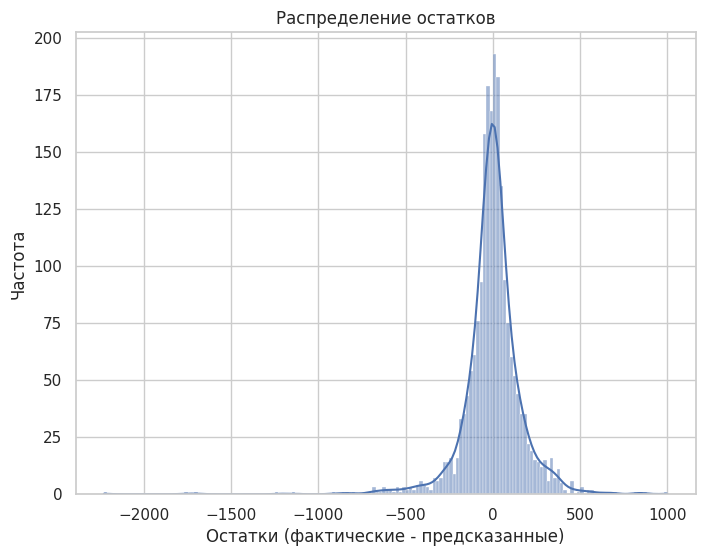

In [212]:
# график остатков
residuals = y_test - y_pred_xgb

plt.figure(figsize=(8, 6))
sns.histplot(residuals, kde=True)
plt.title('Распределение остатков')
plt.xlabel('Остатки (фактические - предсказанные)')
plt.ylabel('Частота')
plt.show()

Распределение остатков близко к нормальному

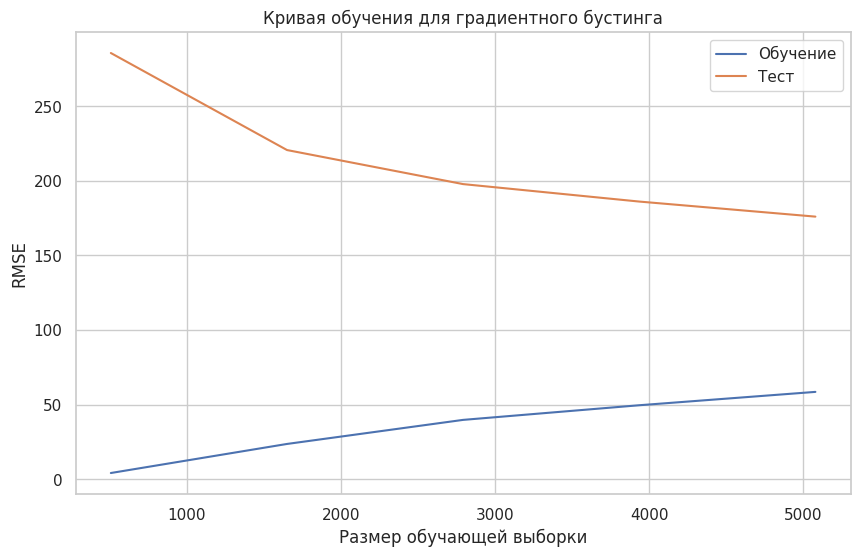

In [216]:
from sklearn.model_selection import learning_curve

# Визуализация кривой обучения
train_sizes, train_scores, test_scores = learning_curve(xgb_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
train_rmse = np.sqrt(-train_scores.mean(axis=1))
test_rmse = np.sqrt(-test_scores.mean(axis=1))

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_rmse, label='Обучение')
plt.plot(train_sizes, test_rmse, label='Тест')
plt.xlabel('Размер обучающей выборки')
plt.ylabel('RMSE')
plt.legend()
plt.title('Кривая обучения для градиентного бустинга')
plt.show()


In [211]:
results = results.append({'Model': 'xgb_model', 'RMSE': rmse_xgb, 'Adjusted R2': adjusted_r2_xgb}, ignore_index=True)
results

<ipython-input-211-275b2c92e602>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'Model': 'xgb_model', 'RMSE': rmse_xgb, 'Adjusted R2': adjusted_r2_xgb}, ignore_index=True)


,Model,RMSE,Adjusted R2
0,baseline_model,432.869632,0.523527
1,lin_reg_all,350.359145,0.681510
2,lin_reg_poly,233.819285,0.603089
3,lin_reg_reduced,353.369936,0.676796
4,dt_model,276.575494,0.801530
5,rf_model,222.408880,0.871657
6,xgb_model,178.085731,0.917714


# Результаты

Градиентный бустинг демонстрирует наилучшие результаты с точки зрения RMSE: 178.09 и Adjusted R2: 0.92.

Хорошие результаты как на обучающем, так и на тестовом наборе данных говорят о стабильности модели и ее способности обобщать на новые данные.

Именно модель xgb_model имеет потенциал для успешного использования в решении задачи прогнозирования.